In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import xarray as xr

from datetime import datetime

import cartopy.crs as ccrs
import cartopy.feature as cfeature

import metpy.calc as mpcalc

from metpy.plots import StationPlot
from metpy.units import units
from netCDF4 import Dataset, num2date
from scipy.ndimage import gaussian_filter
from siphon.catalog import TDSCatalog

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
# file = '/content/drive/MyDrive/Research Project/Climate Science/MetPy Case Study/year1993.nc'

pc_file = '/media/sany/Documents/Project or Research work/Climate Science/Random_data/year1993.nc'
data = xr.open_dataset(pc_file)
data

<xarray.Dataset>
Dimensions:    (longitude: 241, latitude: 241, level: 7, time: 186)
Coordinates:
  * longitude  (longitude) float32 -130.0 -129.8 -129.5 ... -70.5 -70.25 -70.0
  * latitude   (latitude) float32 60.0 59.75 59.5 59.25 ... 0.75 0.5 0.25 0.0
  * level      (level) int32 250 300 500 750 850 925 1000
  * time       (time) datetime64[ns] 1993-03-01 ... 1993-03-31T21:00:00
Data variables:
    z          (time, level, latitude, longitude) float32 ...
    pv         (time, level, latitude, longitude) float32 ...
    r          (time, level, latitude, longitude) float32 ...
    q          (time, level, latitude, longitude) float32 ...
    t          (time, level, latitude, longitude) float32 ...
    u          (time, level, latitude, longitude) float32 ...
    v          (time, level, latitude, longitude) float32 ...
    w          (time, level, latitude, longitude) float32 ...
    vo         (time, level, latitude, longitude) float32 ...
Attributes:
    Conventions:  CF-1.6
    history:      2022-02-13 18:10:46 GMT by grib_to_netcdf-2.24.2: /opt/ecmw...

In [ ]:
# index = 0
# year = str(data['time'].data[index])[0:4]
# month = str(data['time'].data[index])[5:7]
# day = str(data['time'].data[index])[8:10]
# hour = str(data['time'].data[index])[11:13]

In [5]:
lat = data.variables['latitude'][:]
lon = data.variables['longitude'][:]
lev = data.variables['level'][:]

In [ ]:
# subset_250 = data.sel(level=250).squeeze()
# subset_300 = data.sel(level=300).squeeze()
# subset_500 = data.sel(level=500).squeeze()
# subset_750 = data.sel(level=750).squeeze()
# subset_850 = data.sel(level=850).squeeze()
# subset_925 = data.sel(level=925).squeeze()
# subset_1000 = data.sel(level=1000).squeeze()

In [6]:
# select specific data 
def select_data(data, level, start=str(data.time.data[0]), end=str(data.time.data[-1])):
  """
  input:
    data = dataset that you are using
    level = mention your specific level 
    start, end = starting time and ending time. You can copy the time from the main data set. Must be string. 
                 Example: start = '1993-03-01T00:00:00.000000000', end = '1993-03-01T12:00:00.000000000'
                 Leave empty if you want the full time frame.

  output:
    return the specified data

  Example:
  [1] select_data(data, 250, '1993-03-01T00:00:00.000000000','1993-03-01T12:00:00.000000000')-------> this will return dataset from level 250
                                                                                                      with specified time.
  [2] select_data(data, 250) ---> this will return full data of level 250
  """

  subset_data = data.sel(level=level).squeeze()
  time_data = subset_data.sel(time=slice(start,end))
  return time_data 

In [ ]:
data.level.data 

In [7]:
# Example 
start = '1993-03-01T00:00:00.000000000'
end = '1993-03-01T12:00:00.000000000'

subset_250 = select_data(data, 250, start, end)
subset_300 = select_data(data, 300, start, end)
subset_500 = select_data(data, 500, start, end)
subset_750 = select_data(data, 750, start, end)
subset_850 = select_data(data, 850, start, end)
subset_925 = select_data(data, 925, start, end)
subset_1000 = select_data(data, 1000, start, end)

In [8]:
# Calculating temperature advection 
temp_adv_850 = mpcalc.advection(subset_850.t, subset_850.u, subset_850.v)


In [9]:
# Planetary Vorticity 
f = mpcalc.coriolis_parameter(np.deg2rad(lat))

# Relative vorticity 
vor_500 = mpcalc.vorticity(subset_500.u, subset_500.v)

# Absolute Vorticity 
avor_500 = mpcalc.absolute_vorticity(subset_500.u, subset_500.v)

In [10]:
# Vorticity Advection
# f_adv = mpcalc.advection(f, subset_500.u, subset_500.v)
# AxisError: axis 1 is out of bounds for array of dimension 1

relvor_adv = mpcalc.advection(vor_500, subset_500.u, subset_500.v)

relavor_adv = mpcalc.advection(avor_500, subset_500.u, subset_500.v)

In [11]:
#Divergence and Stretching Vorticity
div_500 = mpcalc.divergence(subset_500.u, subset_500.v)
str_vor = -1 * avor_500 * div_500


In [12]:
#wind_speed
wind_300 = mpcalc.wind_speed(subset_300.u, subset_300.v)

#divergence
div_300 = mpcalc.divergence(subset_300.u, subset_300.v)

#geostropic wind 
ugeo_300, vgeo_300 = mpcalc.geostrophic_wind(subset_300.z)

In [ ]:
# # Ageostrophic Wind
# uageo_300 = subset_300.u - ugeo_300
# vageo_300 = subset_300.v - vgeo_300 
# #DimensionalityError: Cannot convert from 'dimensionless' to 'meter / second'

In [13]:
dataproj = ccrs.PlateCarree()
#LambertConformal for mid-latitude view 
plotproj = ccrs.LambertConformal(central_longitude= -100., central_latitude=40.,
                                 standard_parallels=[30,60])

In [14]:
def create_map_background():
    fig=plt.figure(figsize=(14, 12))
    ax=plt.subplot(111, projection=dataproj)
    # North=60, West=-130, East=-70, South=10
    # left, right, bottom, top
    ax.set_extent([-130, -70, 10, 60],ccrs.PlateCarree())
    ax.coastlines('50m', linewidth=0.75)
    ax.add_feature(cfeature.STATES, linewidth=0.5)
    return fig, ax

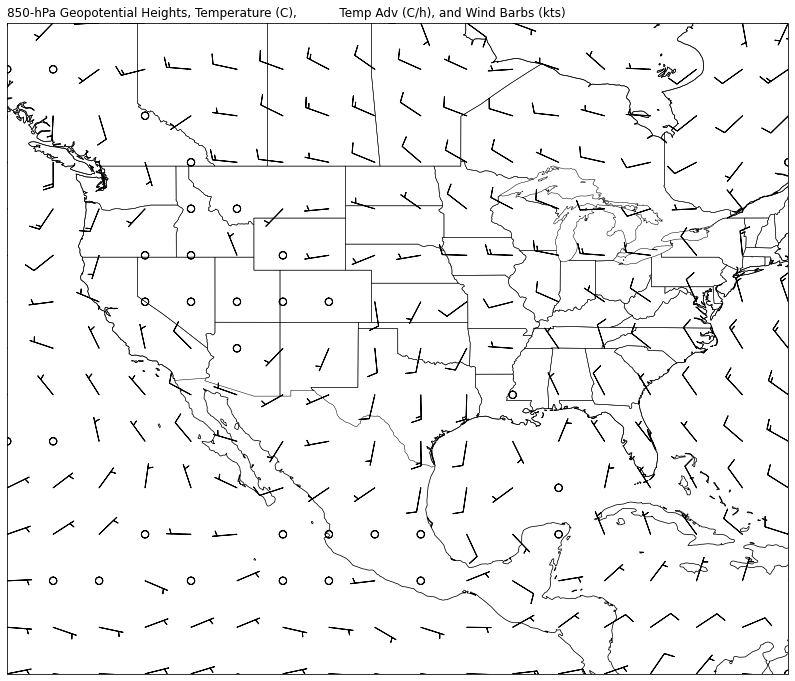

In [15]:
# Cell content replaced by load magic replacement.
fig, ax = create_map_background()

clev850 = np.arange(0, 4000, 30)
cs = ax.contour(lon, lat, subset_850.z.mean('time'), clev850, colors='k',
                linewidths=1.0, linestyles='solid', transform=dataproj)

plt.clabel(cs, fontsize=10, inline=1, inline_spacing=10, fmt='%i',
           rightside_up=True, use_clabeltext=True)

# Vector
ax.barbs(lon, lat, subset_850.u.mean('time').values, subset_850.v.mean('time').values, 
         regrid_shape=15, transform=dataproj)

# Titles
plt.title('850-hPa Geopotential Heights, Temperature (C), \
          Temp Adv (C/h), and Wind Barbs (kts)', loc='left')

plt.show()

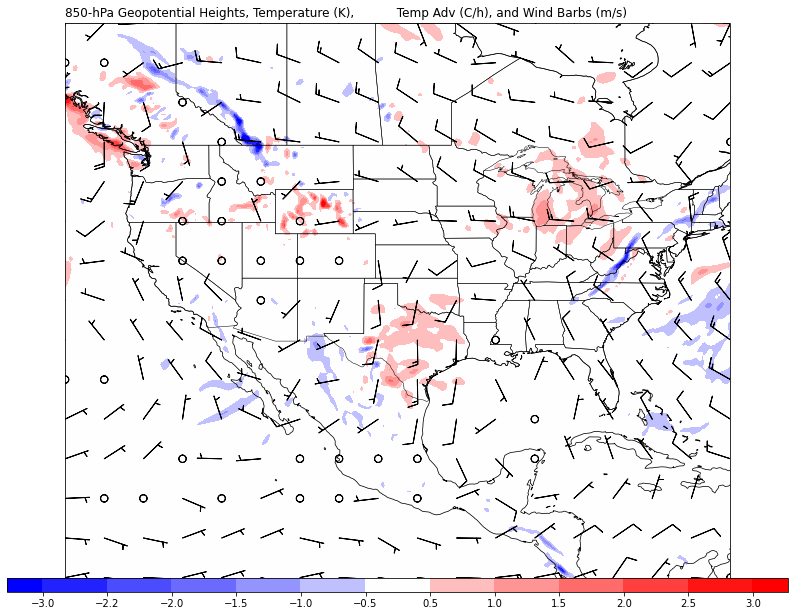

In [17]:
fig, ax = create_map_background()

# Contour 1 - Temperature, dotted
cs2 = ax.contour(lon, lat, subset_850.t.mean('time'), range(-50, 50, 2),
                 colors='grey', linestyles='dotted', transform=dataproj)

plt.clabel(cs2, fontsize=10, inline=1, inline_spacing=10, fmt='%i',
           rightside_up=True, use_clabeltext=True)

# Contour 2
clev850 = np.arange(0, 4000, 30)
cs = ax.contour(lon, lat, subset_850.z.mean('time'), clev850, colors='k',
                linewidths=1.0, linestyles='solid', transform=dataproj)

plt.clabel(cs, fontsize=10, inline=1, inline_spacing=10, fmt='%i',
           rightside_up=True, use_clabeltext=True)

# Filled contours - Temperature advection
contours = [-3, -2.2, -2, -1.5, -1, -0.5, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0]
cf = ax.contourf(lon, lat, temp_adv_850.mean('time')*3600, contours,
                 cmap='bwr', extend='both', transform=dataproj)
plt.colorbar(cf, orientation='horizontal', pad=0, aspect=50,
             extendrect=True, ticks=contours)

# Vector
ax.barbs(lon, lat, subset_850.u.mean('time').values, subset_850.v.mean('time').values, 
         regrid_shape=15, transform=dataproj)

# Titles
plt.title('850-hPa Geopotential Heights, Temperature (K), \
          Temp Adv (C/h), and Wind Barbs (m/s)', loc='left')


plt.show()

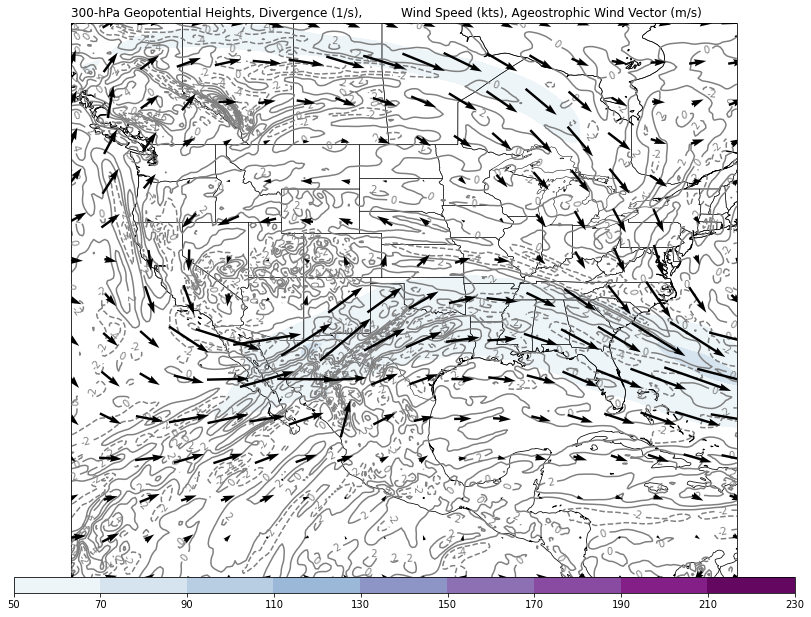

In [19]:
fig, ax = create_map_background()

# Contour 1
clev300 = np.arange(0, 11000, 120)
cs2 = ax.contour(lon, lat, div_300 .mean('time')* 10**5, range(-10, 11, 2),
                 colors='grey', transform=dataproj)
plt.clabel(cs2, fontsize=10, inline=1, inline_spacing=4,
           fmt='%i', rightside_up=True, use_clabeltext=True)

# Contour 2
cs = ax.contour(lon, lat, subset_300.z.mean('time'), clev300, colors='k',
                linewidths=1.0, linestyles='solid', transform=dataproj)
plt.clabel(cs, fontsize=10, inline=1, inline_spacing=4,
           fmt='%i', rightside_up=True, use_clabeltext=True)

# Filled Contours
spd300 = np.arange(50, 250, 20)
cf = ax.contourf(lon, lat, wind_300.mean('time'), spd300, cmap='BuPu',
                 transform=dataproj, zorder=0)
plt.colorbar(cf, orientation='horizontal', pad=0.0, aspect=50)

#Couldn't calculate Ageostropic Wind Vectors 
# Vector of 300-hPa geostrophic Wind Vectors
ax.quiver(lon, lat, ugeo_300.mean('time').values, vgeo_300.mean('time').values, regrid_shape=15,
          pivot='mid', transform=dataproj, zorder=10)

# Titles
plt.title('300-hPa Geopotential Heights, Divergence (1/s),\
          Wind Speed (kts), Ageostrophic Wind Vector (m/s)',
          loc='left')
# plt.title('VALID: 1993-03-13T00', loc='right')

plt.show()

In [ ]:
str(time)[0:13]

'1993-03-01T00'

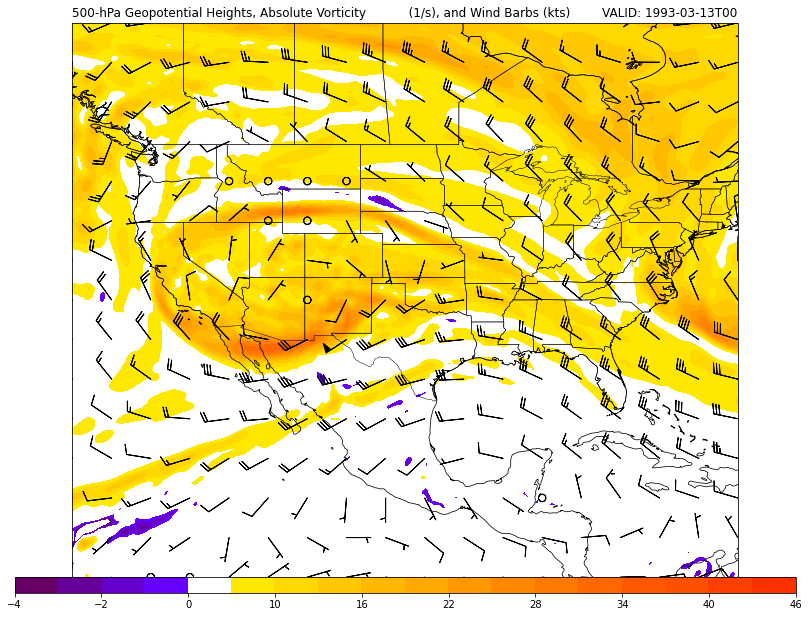

In [18]:
fig, ax = create_map_background()

# Contour 1
clev500 = np.arange(0, 7000, 60)
cs = ax.contour(lon, lat, subset_500.z.mean('time'), clev500, colors='k',
                linewidths=1.0, linestyles='solid', transform=dataproj)
plt.clabel(cs, fontsize=10, inline=1, inline_spacing=4,
           fmt='%i', rightside_up=True, use_clabeltext=True)

# Filled contours
# Set contour intervals for Absolute Vorticity
clevavor500 = [-4, -3, -2, -1, 0, 7, 10, 13, 16, 19,
               22, 25, 28, 31, 34, 37, 40, 43, 46]

# Set colorfill colors for absolute vorticity
# purple negative
# yellow to orange positive
colorsavor500 = ('#660066', '#660099', '#6600CC', '#6600FF',
                 '#FFFFFF', '#ffE800', '#ffD800', '#ffC800',
                 '#ffB800', '#ffA800', '#ff9800', '#ff8800',
                 '#ff7800', '#ff6800', '#ff5800', '#ff5000',
                 '#ff4000', '#ff3000')

cf = ax.contourf(lon, lat, avor_500.mean('time') * 10**5, clevavor500,
                 colors=colorsavor500, transform=dataproj)
plt.colorbar(cf, orientation='horizontal', pad=0, aspect=50)

# Vector
ax.barbs(lon, lat, subset_500.u.mean('time').values, subset_500.v.mean('time').values,
         regrid_shape=15, transform=dataproj)

# Titles
plt.title('500-hPa Geopotential Heights, Absolute Vorticity \
          (1/s), and Wind Barbs (kts)', loc='left')
plt.title('VALID: 1993-03-13T00', loc='right')

plt.show()

In [20]:
#important

In [21]:
# select specific data 
def specific_data(data, level, time = '1993-03-01T00:00:00.000000000'):
  subset_data = data.sel(level=level).squeeze()
  time_data = subset_data.sel(time=time)
  return time_data 

Text(0.5, 1.03, '1993-03-01T00')

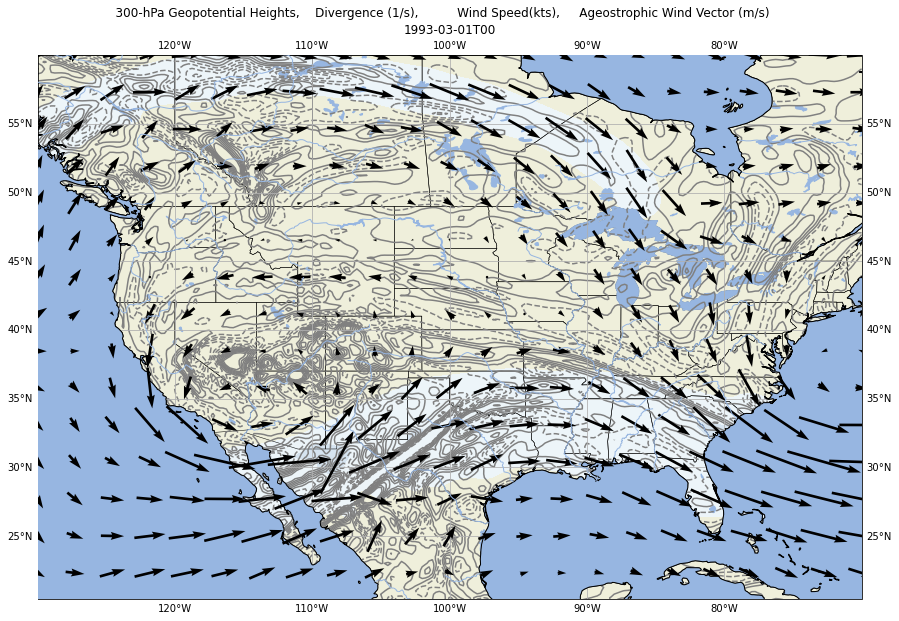

In [61]:
#Specific Time without mean 

fig = plt.figure(figsize=(22, 10))
ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())

level = 300
time = '1993-03-01T00:00:00.000000000'
subset = specific_data(data, level, time)

#wind_speed
wind_300 = mpcalc.wind_speed(subset.u, subset.v)
div_300 = mpcalc.divergence(subset.u, subset.v)
ugeo_300, vgeo_300 = mpcalc.geostrophic_wind(subset.z)


clev300 = np.arange(0, 11000, 120)
spd300 = np.arange(50, 250, 20)

ax.contour(lon, lat, div_300* 10**5, range(-10, 11, 2), colors='grey', transform=dataproj)
ax.contour(lon, lat, subset.z, clev300, colors='k', linewidths=1.0, linestyles='solid', transform=dataproj)
ax.contourf(lon, lat, wind_300, spd300, cmap='BuPu', transform=dataproj, zorder=0)

ax.quiver(lon, lat, ugeo_300.values, vgeo_300.values, regrid_shape=15,
          pivot='mid', transform=dataproj, zorder=10)

ax.gridlines(draw_labels=True)
ax.coastlines('50m', linewidth=0.75)
ax.add_feature(cfeature.STATES, linewidth=0.5)
ax.add_feature(cfeature.OCEAN, zorder=4, edgecolor='k')
ax.add_feature(cfeature.LAKES)
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.RIVERS, zorder=100)

plt.title('                    300-hPa Geopotential Heights,    Divergence (1/s),\
          Wind Speed(kts),     Ageostrophic Wind Vector (m/s)',loc='left', y= 1.06)

plt.title(str(time)[0:13], loc ='center', y = 1.03)

# plt.title('Level=',level, loc='right')

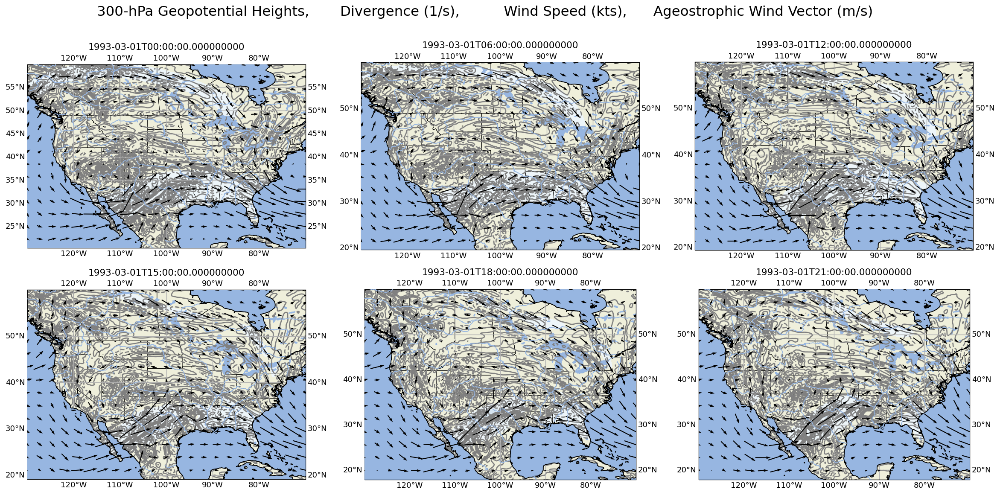

In [64]:
# Loop between hour a day 
start = '1993-03-01T00'
end = '1993-03-01T23'
date = data.sel(time=slice(start, end)).time.values


fig = plt.figure(figsize=(22, 10), dpi=130) #increase dpi for high res image 
nrows = 2
ncols = 3

for i in range(1, nrows*ncols+1):
    ax = plt.subplot(nrows,ncols,i, projection=ccrs.PlateCarree())

    hour = str(data.sel(time=slice(start, end)).time.values[i-1])
    subset = specific_data(data, 300, hour)

    #wind_speed, divergence, geostropic wind
    wind_300 = mpcalc.wind_speed(subset.u, subset.v)
    div_300 = mpcalc.divergence(subset.u, subset.v)
    ugeo_300, vgeo_300 = mpcalc.geostrophic_wind(subset.z)


    clev300 = np.arange(0, 11000, 120)
    spd300 = np.arange(50, 250, 20)

    ax.contour(lon, lat, div_300* 10**5, range(-10, 11, 2), colors='grey', transform=dataproj)
    ax.contour(lon, lat, subset.z, clev300, colors='k', linewidths=1.0, linestyles='solid', transform=dataproj)
    ax.contourf(lon, lat, wind_300, spd300, cmap='BuPu', transform=dataproj, zorder=0)
    ax.quiver(lon, lat, ugeo_300.values, vgeo_300.values, regrid_shape=15,
              pivot='mid', transform=dataproj, zorder=10)


    ax.gridlines(draw_labels=True)
    ax.coastlines('50m', linewidth=0.75)
    ax.add_feature(cfeature.STATES, linewidth=0.5)
    ax.add_feature(cfeature.OCEAN, zorder=4, edgecolor='k')
    ax.add_feature(cfeature.LAKES)
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.RIVERS, zorder=100)

    plt.title(hour)
    


fig.suptitle("300-hPa Geopotential Heights,       Divergence (1/s),\
          Wind Speed (kts),      Ageostrophic Wind Vector (m/s)", fontsize=18, y=0.98)
# fig.suptitle(level, fontsize=18, y=0.98)

plt.show()

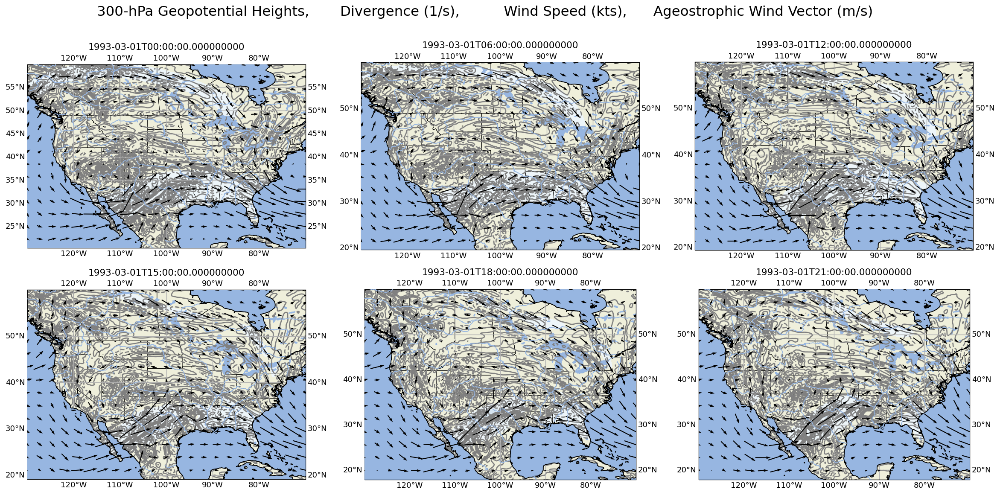

In [163]:
# Loop between hour a day 
start = '1993-03-01T00'
end = '1993-03-01T23'
level = 300

date = data.sel(time=slice(start, end)).time.values


fig = plt.figure(figsize=(22, 10), dpi=130) #increase dpi for high res image 
nrows = 2
ncols = 3

for i in range(1, nrows*ncols+1):
    ax = plt.subplot(nrows,ncols,i, projection=ccrs.PlateCarree())

    hour = str(data.sel(time=slice(start, end)).time.values[i-1])
    subset = specific_data(data, level, hour)

    #wind_speed, divergence, geostropic wind
    wind_300 = mpcalc.wind_speed(subset.u, subset.v)
    div_300 = mpcalc.divergence(subset.u, subset.v)
    ugeo_300, vgeo_300 = mpcalc.geostrophic_wind(subset.z)


    clev300 = np.arange(0, 11000, 120)
    spd300 = np.arange(50, 250, 20)

    ax.contour(lon, lat, div_300* 10**5, range(-10, 11, 2), colors='grey', transform=dataproj)
    ax.contour(lon, lat, subset.z, clev300, colors='k', linewidths=1.0, linestyles='solid', transform=dataproj)
    ax.contourf(lon, lat, wind_300, spd300, cmap='BuPu', transform=dataproj, zorder=0)
    ax.quiver(lon, lat, ugeo_300.values, vgeo_300.values, regrid_shape=15,
              pivot='mid', transform=dataproj, zorder=10)


    ax.gridlines(draw_labels=True)
    ax.coastlines('50m', linewidth=0.75)
    ax.add_feature(cfeature.STATES, linewidth=0.5)
    ax.add_feature(cfeature.OCEAN, zorder=4, edgecolor='k')
    ax.add_feature(cfeature.LAKES)
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.RIVERS, zorder=100)

    plt.title(hour)
    


fig.suptitle("300-hPa Geopotential Heights,       Divergence (1/s),\
          Wind Speed (kts),      Ageostrophic Wind Vector (m/s)", fontsize=18, y=0.98)

plt.show()

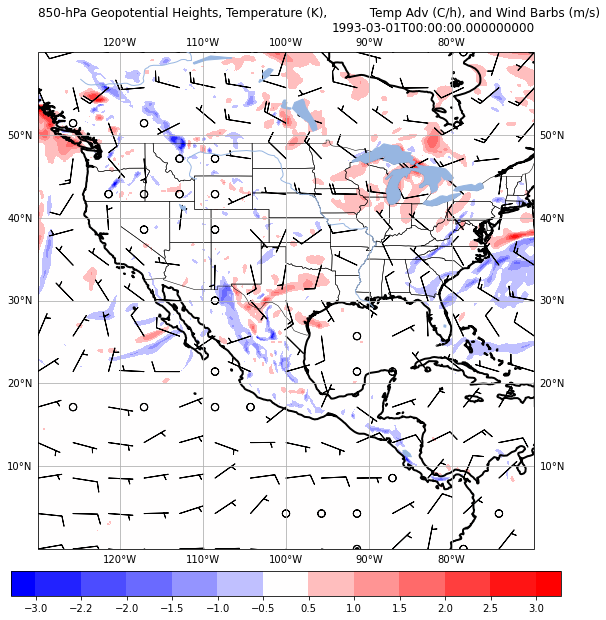

In [147]:
#Specific Time without mean 

fig= plt.figure(figsize=(22, 10))
ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())


level = 850
time = '1993-03-01T00:00:00.000000000'
subset = specific_data(data, level, time)


# Calculating temperature advection 
temp_adv_850 = mpcalc.advection(subset.t, subset.u, subset.v)


# Contour 1 - Temperature, dotted
cs1 = ax.contour(lon, lat, subset.t, range(-50, 50, 2), colors='grey', linestyles='dotted', transform=dataproj)
plt.clabel(cs1, fontsize=10, inline=1, inline_spacing=10, fmt='%i', rightside_up=True, use_clabeltext=True)


# Contour 2
clev850 = np.arange(0, 4000, 30)
cs2 = ax.contour(lon, lat, subset.z, clev850, colors='k', linewidths=1.0, linestyles='solid', transform=dataproj)
plt.clabel(cs2, fontsize=10, inline=1, inline_spacing=10, fmt='%i', rightside_up=True, use_clabeltext=True)


# Filled contours - Temperature advection
contours = [-3, -2.2, -2, -1.5, -1, -0.5, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0]
cf = ax.contourf(lon, lat, temp_adv_850*3600, contours, cmap='bwr', extend='both', transform=dataproj)
plt.colorbar(cf, orientation='horizontal',fraction=0.046, pad=0.04, extendrect=True, ticks=contours)

# Vector
ax.barbs(lon, lat, subset.u.values, subset.v.values,regrid_shape=15, transform=dataproj)

ax.gridlines(draw_labels=True)
ax.coastlines('50m', linewidth=2)
ax.add_feature(cfeature.STATES, linewidth=0.5)
ax.add_feature(cfeature.LAKES)
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.RIVERS, zorder=100)

# Titles
plt.title('850-hPa Geopotential Heights, Temperature (K), \
          Temp Adv (C/h), and Wind Barbs (m/s)', loc='left', y = 1.06)
plt.title(time, loc='right', y = 1.03)

plt.show()

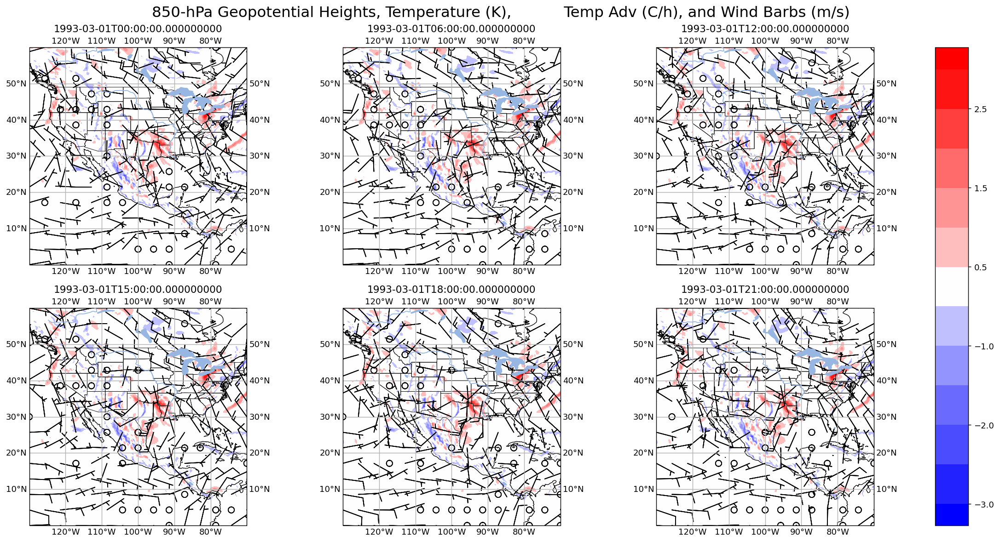

In [167]:
start = '1993-03-01T00'
end = '1993-03-01T23'
level = 850


fig = plt.figure(figsize=(22,10), dpi=130)
nrows = 2
ncols = 3

# Calculating temperature advection 
temp_adv_850 = mpcalc.advection(subset.t, subset.u, subset.v)


for i in range(1, nrows*ncols+1):
    ax = plt.subplot(nrows,ncols,i, projection=ccrs.PlateCarree())

    hour = str(data.sel(time=slice(start, end)).time.values[i-1])
    subset = specific_data(data, level, hour)


    # Contour 1 - Temperature, dotted
    cs1 = ax.contour(lon, lat, subset.t, range(-50, 50, 2), colors='grey', linestyles='dotted', transform=dataproj)
    plt.clabel(cs1, fontsize=10, inline=1, inline_spacing=10, fmt='%i', rightside_up=True, use_clabeltext=True)


    # Contour 2
    clev850 = np.arange(0, 4000, 30)
    cs2 = ax.contour(lon, lat, subset.z, clev850, colors='k', linewidths=1.0, linestyles='solid', transform=dataproj)
    plt.clabel(cs2, fontsize=10, inline=1, inline_spacing=10, fmt='%i', rightside_up=True, use_clabeltext=True)


    # # Filled contours - Temperature advection
    contours = [-3, -2.2, -2, -1.5, -1, -0.5, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0]
    cf = ax.contourf(lon, lat, temp_adv_850*3600, contours, cmap='bwr', extend='both', transform=dataproj)
    # plt.colorbar(cf, orientation='horizontal',fraction=0.046, pad=0.04, extendrect=True, ticks=contours)

    # Vector
    ax.barbs(lon, lat, subset.u.values, subset.v.values,regrid_shape=15, transform=dataproj)
    

    ax.gridlines(draw_labels=True)
    ax.coastlines('50m', linewidth=0.75)
    ax.add_feature(cfeature.STATES, linewidth=0.5)
    ax.add_feature(cfeature.LAKES)
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.RIVERS, zorder=100)

    plt.title(hour)
    
#colorbar_setting
plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9)
cax = plt.axes([0.83, 0.1, 0.025, 0.8]) #plt.axes([x_position,y_position,width,height])
plt.colorbar(cf,cax=cax,  orientation='vertical', extendrect=True) 

# fig.suptitle("300-hPa Geopotential Heights,       Divergence (1/s),\
#           Wind Speed (kts),      Ageostrophic Wind Vector (m/s)", fontsize=18, y=0.98)



fig.suptitle('850-hPa Geopotential Heights, Temperature (K), \
          Temp Adv (C/h), and Wind Barbs (m/s)', fontsize=18, y=0.97)


plt.show()

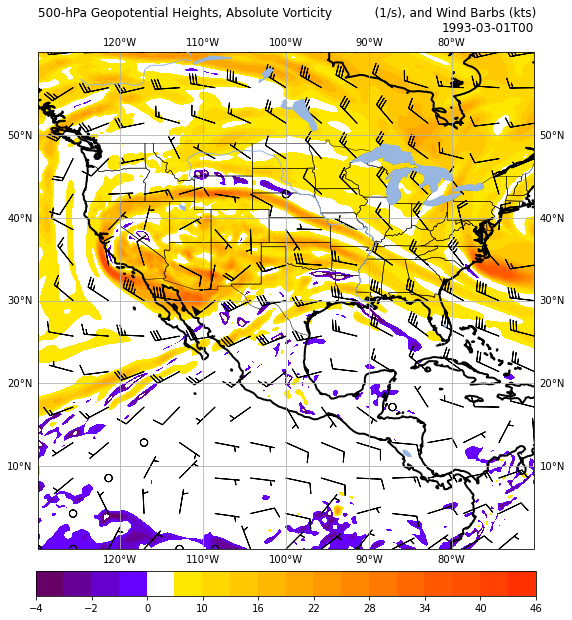

In [170]:
#Specific Time without mean 

fig= plt.figure(figsize=(22, 10))
ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())


level = 500
time = '1993-03-01T00:00:00.000000000'
subset = specific_data(data, level, time)

# Absolute Vorticity 
avor_500 = mpcalc.absolute_vorticity(subset.u, subset.v)

# Contour 1
clev500 = np.arange(0, 7000, 60)
cs = ax.contour(lon, lat, subset.z, clev500, colors='k',
                linewidths=1.0, linestyles='solid', transform=dataproj)
plt.clabel(cs, fontsize=10, inline=1, inline_spacing=4,
           fmt='%i', rightside_up=True, use_clabeltext=True)

# Filled contours
# Set contour intervals for Absolute Vorticity
clevavor500 = [-4, -3, -2, -1, 0, 7, 10, 13, 16, 19,
               22, 25, 28, 31, 34, 37, 40, 43, 46]

# Set colorfill colors for absolute vorticity
# purple negative
# yellow to orange positive
colorsavor500 = ('#660066', '#660099', '#6600CC', '#6600FF',
                 '#FFFFFF', '#ffE800', '#ffD800', '#ffC800',
                 '#ffB800', '#ffA800', '#ff9800', '#ff8800',
                 '#ff7800', '#ff6800', '#ff5800', '#ff5000',
                 '#ff4000', '#ff3000')

cf = ax.contourf(lon, lat, avor_500 * 10**5, clevavor500,
                 colors=colorsavor500, transform=dataproj)
# plt.colorbar(cf, orientation='horizontal', pad=0, aspect=50)
plt.colorbar(cf, orientation='horizontal',fraction=0.046, pad=0.04, extendrect=True)

# Vector
ax.barbs(lon, lat, subset.u.values, subset.v.values,
         regrid_shape=15, transform=dataproj)

ax.gridlines(draw_labels=True)
ax.coastlines('50m', linewidth=2)
ax.add_feature(cfeature.STATES, linewidth=0.5)
ax.add_feature(cfeature.LAKES)
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.RIVERS, zorder=100)


# Titles
plt.title('500-hPa Geopotential Heights, Absolute Vorticity \
          (1/s), and Wind Barbs (kts)', loc='left', y = 1.06)
plt.title(str(time)[:13], loc='right' , y = 1.03)

plt.show()

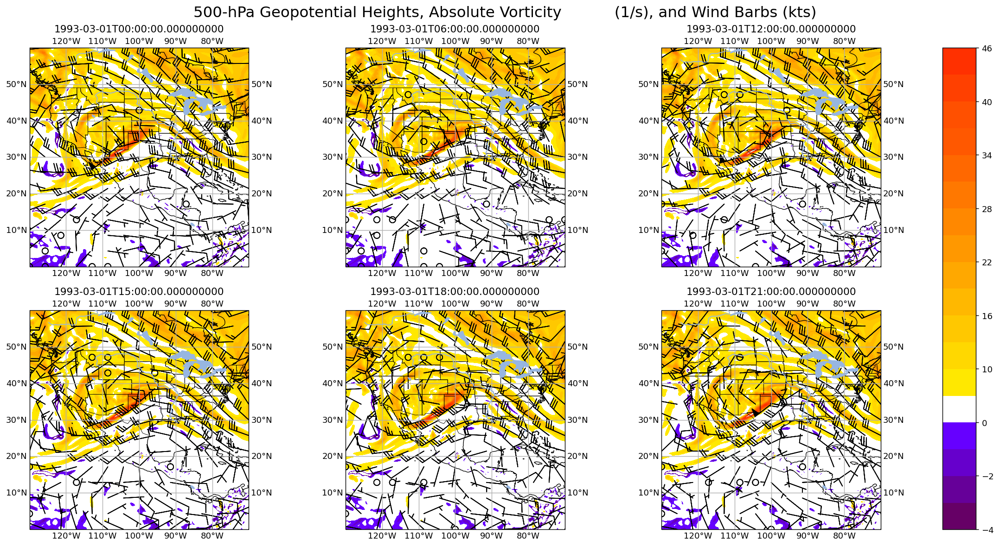

In [172]:
start = '1993-03-01T00'
end = '1993-03-01T23'
level = 500


fig = plt.figure(figsize=(22,10), dpi=130)
nrows = 2
ncols = 3

# Absolute Vorticity 
avor_500 = mpcalc.absolute_vorticity(subset.u, subset.v)


for i in range(1, nrows*ncols+1):
    ax = plt.subplot(nrows,ncols,i, projection=ccrs.PlateCarree())

    hour = str(data.sel(time=slice(start, end)).time.values[i-1])
    subset = specific_data(data, level, hour)


    # Contour 1
    clev500 = np.arange(0, 7000, 60)
    cs = ax.contour(lon, lat, subset.z, clev500, colors='k',
                    linewidths=1.0, linestyles='solid', transform=dataproj)
    plt.clabel(cs, fontsize=10, inline=1, inline_spacing=4,
               fmt='%i', rightside_up=True, use_clabeltext=True)

    # Filled contours
    # Set contour intervals for Absolute Vorticity
    clevavor500 = [-4, -3, -2, -1, 0, 7, 10, 13, 16, 19,
                   22, 25, 28, 31, 34, 37, 40, 43, 46]

    # Set colorfill colors for absolute vorticity
    # purple negative
    # yellow to orange positive
    colorsavor500 = ('#660066', '#660099', '#6600CC', '#6600FF',
                     '#FFFFFF', '#ffE800', '#ffD800', '#ffC800',
                     '#ffB800', '#ffA800', '#ff9800', '#ff8800',
                     '#ff7800', '#ff6800', '#ff5800', '#ff5000',
                     '#ff4000', '#ff3000')

    cf = ax.contourf(lon, lat, avor_500 * 10**5, clevavor500,
                     colors=colorsavor500, transform=dataproj)

    # Vector
    ax.barbs(lon, lat, subset.u.values, subset.v.values,
             regrid_shape=15, transform=dataproj)
    

    ax.gridlines(draw_labels=True)
    ax.coastlines('50m', linewidth=0.75)
    ax.add_feature(cfeature.STATES, linewidth=0.5)
    ax.add_feature(cfeature.LAKES)
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.RIVERS, zorder=100)

    plt.title(hour)
    
#colorbar_setting
plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9)
cax = plt.axes([0.83, 0.1, 0.025, 0.8]) #plt.axes([x_position,y_position,width,height])
plt.colorbar(cf,cax=cax,  orientation='vertical', extendrect=True) 

#titles
fig.suptitle('500-hPa Geopotential Heights, Absolute Vorticity \
          (1/s), and Wind Barbs (kts)', fontsize=18, y=0.97)



plt.show()